# Run Me First

In [ ]:
import numpy as np
import random

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# We don't really need this magic command in Google Colab
%matplotlib inline

from sklearn.linear_model import SGDClassifier

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

from sklearn.datasets import fetch_openml



# Optimization Algorithms

## Maxima, Minima, Local Maximum/Minimum Points

### Quadratic funcion (Single maxima/minima point)

Global Maximum at x = 2.5, f(2.5) = 8.25
Global Minimum at x = 0, f(0) = 2
Local Maximum at x = 2.5, f(2.5) = 8.25


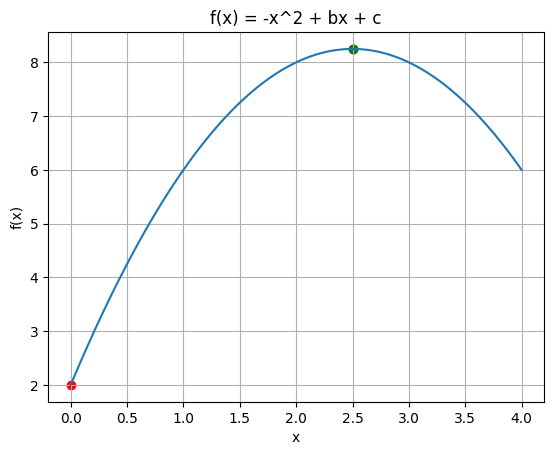

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

def f(x, b, c):
  """
  Defines the function f(x) = -x^2 + bx + c.
  """
  return -x**2 + b*x + c

def find_extrema(b, c, interval):
  """
  Finds the extrema (maxima and minima) of f(x) within the given interval.
  """
  # Find the critical point (derivative = 0)
  critical_point = b / 2

  # Check if the critical point is within the interval
  if 0 <= critical_point <= 4:
    # Evaluate the function at the critical point and endpoints of the interval
    function_values = {
        0: f(0, b, c),
        critical_point : f(critical_point, b, c),
        4: f(4, b, c)
    }

    # Determine the maximum and minimum
    maxima = max(function_values, key=function_values.get)
    minima = min(function_values, key=function_values.get)

    # Determine local maximum/minimum
    local_max = critical_point if critical_point == maxima and (maxima != 0 and maxima != 4) else None
    local_min = critical_point if critical_point == minima and (minima != 0 and minima != 4) else None

    return maxima, minima, local_max, local_min
  else:
      # Critical point outside the interval, compare endpoints only
      function_values = {0:f(0,b,c), 4:f(4,b,c)}
      maxima = max(function_values, key = function_values.get)
      minima = min(function_values, key = function_values.get)
      return maxima, minima, None, None

b = 5
c = 2
interval = [0, 4]

maxima, minima, local_max, local_min = find_extrema(b, c, interval)

print(f"Global Maximum at x = {maxima}, f({maxima}) = {f(maxima, b, c)}")
print(f"Global Minimum at x = {minima}, f({minima}) = {f(minima, b, c)}")

if local_max:
    print(f"Local Maximum at x = {local_max}, f({local_max}) = {f(local_max, b, c)}")
if local_min:
    print(f"Local Minimum at x = {local_min}, f({local_min}) = {f(local_min, b, c)}")

# Plot the function
x_vals = np.linspace(0, 4, 400)
y_vals = f(x_vals, b, c)
plt.plot(x_vals, y_vals)

# Mark extrema points
plt.scatter([maxima, minima], [f(maxima,b,c), f(minima,b,c)], color='red')
if local_max:
  plt.scatter(local_max, f(local_max,b,c), color='green')
if local_min:
  plt.scatter(local_min, f(local_min, b, c), color='green')


plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('f(x) = -x^2 + 5x + 2')
plt.grid(True)
plt.show()


### Multiple maxima/minima points

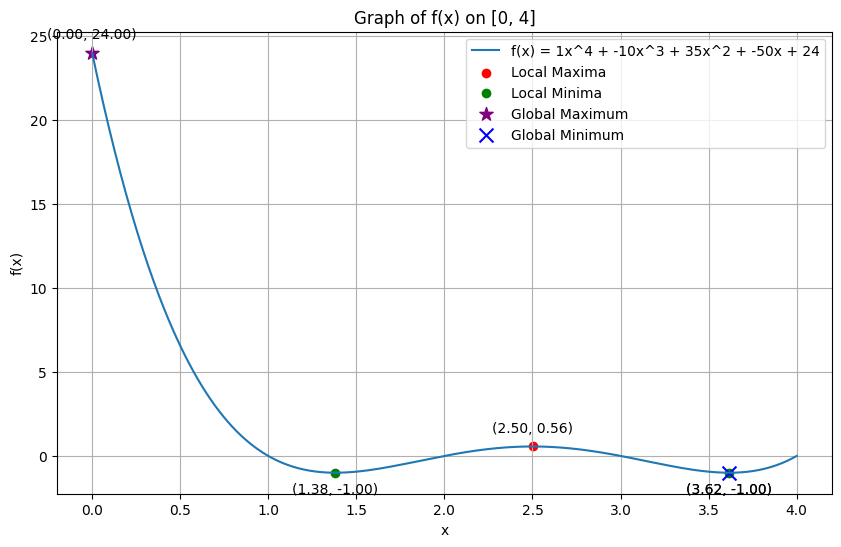

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema

# 1. Define a polynomial f(x) of degree 4
# Let's choose some coefficients to ensure local maxima and minima
coefficients = [1, -10, 35, -50, 24]  # Corresponds to f(x) = x^4 - 10x^3 + 35x^2 - 50x + 24
f = np.poly1d(coefficients)

# 2. Consider an interval I = [0, 4]
x = np.linspace(0, 4, 500)  # Create 500 points in the interval [0, 4]
y = f(x)

# 3. f(x) has local maximum/minimum values (This is by design of our chosen polynomial)

# 4. Plot the graph of f(x) on I
plt.figure(figsize=(10, 6))
plt.plot(x, y, label=f'f(x) = {coefficients[0]}x^4 + {coefficients[1]}x^3 + {coefficients[2]}x^2 + {coefficients[3]}x + {coefficients[4]}')
plt.title('Graph of f(x) on [0, 4]')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.grid(True)

# 5. Show the maxima, minima, local maximum/minimum points on the graph

# Find local maxima and minima using argrelextrema
# For local maxima, compare with the negated values of y
local_max_indices = argrelextrema(y, np.greater)[0]
local_min_indices = argrelextrema(y, np.less)[0]

# Find global maximum and minimum within the interval
global_max_index = np.argmax(y)
global_min_index = np.argmin(y)

# Plot local maxima
plt.scatter(x[local_max_indices], y[local_max_indices], color='red', marker='o', label='Local Maxima')
for i in local_max_indices:
    plt.annotate(f'({x[i]:.2f}, {y[i]:.2f})', (x[i], y[i]), textcoords="offset points", xytext=(0,10), ha='center')

# Plot local minima
plt.scatter(x[local_min_indices], y[local_min_indices], color='green', marker='o', label='Local Minima')
for i in local_min_indices:
    plt.annotate(f'({x[i]:.2f}, {y[i]:.2f})', (x[i], y[i]), textcoords="offset points", xytext=(0,-15), ha='center')

# Highlight global maximum if it's a local maximum
if global_max_index in local_max_indices:
    plt.scatter(x[global_max_index], y[global_max_index], color='blue', marker='*', s=100, label='Global Maximum')
    plt.annotate(f'({x[global_max_index]:.2f}, {y[global_max_index]:.2f})', (x[global_max_index], y[global_max_index]), textcoords="offset points", xytext=(0,10), ha='center')
else:
    plt.scatter(x[global_max_index], y[global_max_index], color='purple', marker='*', s=100, label='Global Maximum')
    plt.annotate(f'({x[global_max_index]:.2f}, {y[global_max_index]:.2f})', (x[global_max_index], y[global_max_index]), textcoords="offset points", xytext=(0,10), ha='center')

# Highlight global minimum if it's a local minimum
if global_min_index in local_min_indices:
    plt.scatter(x[global_min_index], y[global_min_index], color='blue', marker='x', s=100, label='Global Minimum')
    plt.annotate(f'({x[global_min_index]:.2f}, {y[global_min_index]:.2f})', (x[global_min_index], y[global_min_index]), textcoords="offset points", xytext=(0,-15), ha='center')
else:
    plt.scatter(x[global_min_index], y[global_min_index], color='orange', marker='x', s=100, label='Global Minimum')
    plt.annotate(f'({x[global_min_index]:.2f}, {y[global_min_index]:.2f})', (x[global_min_index], y[global_min_index]), textcoords="offset points", xytext=(0,-15), ha='center')

plt.legend()
plt.show()

### Saddle Points

$$ z = f(x,y) = x^2 -y^2$$

At $(x,y) = (0,0)$, the function's behavior (whether it's a maximum or minimum) depends on the direction considered (i.e., the variable). You can verify this by examining the partial derivatives $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$.


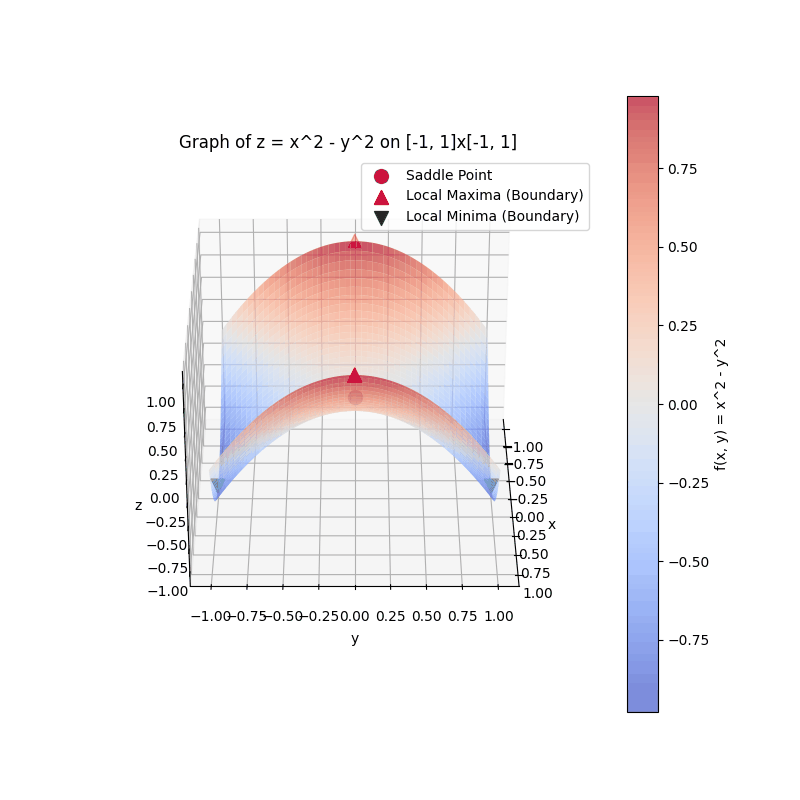

### Saddle Points Animation

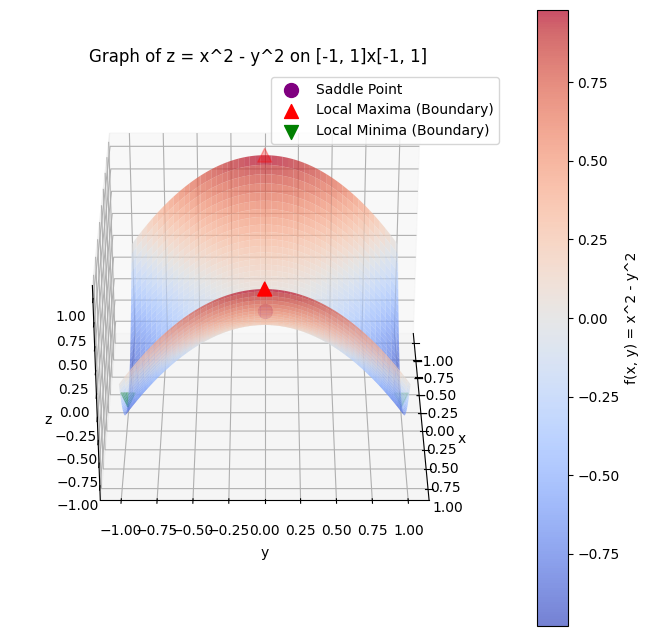

Animation saved to saddle_point_rotation.gif


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# 1. Define the function z = f(x, y) = x^2 - y^2
def f(x, y):
    return x**2 - y**2

# 2. Consider the interval x, y in [-1, 1], [-1, 1]
x = np.linspace(-1, 1, 100)
y = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# 3. Plot the graph of z = f(x, y)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.7)
fig.colorbar(surf, ax=ax, label='f(x, y) = x^2 - y^2')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title('Graph of z = x^2 - y^2 on [-1, 1]x[-1, 1]')

# 4. Show the maxima, minima, local maximum/minimum points on the graph

# Saddle point at (0, 0, 0)
ax.scatter(0, 0, 0, color='purple', marker='o', s=100, label='Saddle Point')

# Potential local maxima (on the boundary)
ax.scatter([-1, 1], [0, 0], [1, 1], color='red', marker='^', s=100, label='Local Maxima (Boundary)')

# Potential local minima (on the boundary)
ax.scatter([0, 0], [-1, 1], [-1, -1], color='green', marker='v', s=100, label='Local Minima (Boundary)')

ax.legend()

# 5. Rotate the graph of z around point (0,0,0) and save it to a movie/animation file.

def rotate(angle):
    ax.view_init(azim=angle)

angle_range = np.linspace(0, 360, 120) # Rotate 360 degrees in 120 frames
ani = FuncAnimation(fig, rotate, frames=angle_range, interval=50)

# Save the animation
animation_file = 'saddle_point_rotation.gif'
ani.save(animation_file, writer='pillow') # You might need to install Pillow: pip install Pillow

plt.show()

print(f"Animation saved to {animation_file}")

### Hill Climbing Algorithm (1D)

This is a classical and sub-optimal algorithm.

- Stuck at a local maxima (see example below)
- Results depend on starting points
- Deterministic

Animation saved to fx-animate.gif
Animation saved to fx-animate.mp4


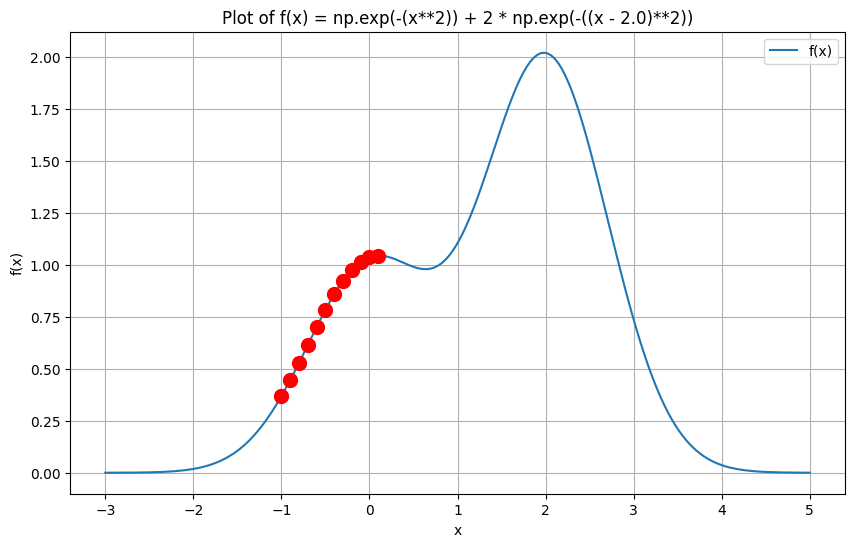


Comparing Hill Climbing Results from Different Start Points:
Starting point: x = -2.0
Maximum found at x = 0.1000
Maximum value f(x) = 1.0442
------------------------------
Starting point: x = 0.0
Maximum found at x = 0.1000
Maximum value f(x) = 1.0442
------------------------------
Starting point: x = 1.0
Maximum found at x = 2.0000
Maximum value f(x) = 2.0183
------------------------------
Starting point: x = 2.0
Maximum found at x = 2.0000
Maximum value f(x) = 2.0183
------------------------------
Starting point: x = 4.0
Maximum found at x = 2.0000
Maximum value f(x) = 2.0183
------------------------------
Starting point: x = 100.0
Maximum found at x = 100.0000
Maximum value f(x) = 0.0000
------------------------------


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Define the function
def f(x):
    return np.exp(-(x**2)) + 2 * np.exp(-((x - 2.0)**2))

# 1. Plot f(x) on x, y plane
fig, ax = plt.subplots(figsize=(10, 6))
x_plot = np.linspace(-3, 5, 200)
y_plot = f(x_plot)
ax.plot(x_plot, y_plot, label='f(x)')
ax.set_xlabel('x')
ax.set_ylabel('f(x)')
ax.set_title('Plot of f(x) = np.exp(-(x**2)) + 2 * np.exp(-((x - 2.0)**2))')
ax.legend()
ax.grid(True)

# 2. Save the animation to fx-animate.gif, and fx-animate.mp4 (or avi)
def hill_climbing_animate(func, start_point, step_size, num_iterations):
    current_x = start_point
    path = [current_x]

    for _ in range(num_iterations):
        neighbors = [current_x - step_size, current_x + step_size]
        best_neighbor = current_x
        best_value = func(current_x)

        for neighbor in neighbors:
            neighbor_value = func(neighbor)
            if neighbor_value > best_value:
                best_value = neighbor_value
                best_neighbor = neighbor

        if best_neighbor == current_x:
            break  # Local maximum found

        current_x = best_neighbor
        path.append(current_x)
    return path

start_point_animate = -1.0
step_size_animate = 0.1
num_iterations_animate = 50
path = hill_climbing_animate(f, start_point_animate, step_size_animate, num_iterations_animate)

point, = ax.plot([], [], 'ro', markersize=10)

# def animate(i):
#     if i < len(path):
#         point.set_data(path[i], f(path[i]))
#         return point,

def animate(i):
    if i < len(path):
        point.set_data(path[:i+1], f(np.array(path[:i+1]))) # Pass a sequence to set_data
        return point,

ani = FuncAnimation(fig, animate, frames=len(path), interval=200, blit=True)

# Save the animation to GIF
gif_file = 'fx-animate.gif'
ani.save(gif_file, writer='pillow')
print(f"Animation saved to {gif_file}")

# Save the animation to MP4 (requires ffmpeg)
mp4_file = 'fx-animate.mp4'
try:
    ani.save(mp4_file, writer='ffmpeg', fps=10)
    print(f"Animation saved to {mp4_file}")
except Exception as e:
    print(f"Error saving MP4 animation: {e}")
    print("Please ensure ffmpeg is installed if you want to save as MP4.")

plt.show()

# 3. Python program using Hill climbing algorithm to find the maxima of the function
def hill_climbing(func, start_point, step_size, num_iterations):
    current_x = start_point
    current_value = func(current_x)

    for i in range(num_iterations):
        neighbors = [current_x - step_size, current_x + step_size]
        best_neighbor = current_x
        best_value = current_value

        for neighbor in neighbors:
            neighbor_value = func(neighbor)
            if neighbor_value > best_value:
                best_value = neighbor_value
                best_neighbor = neighbor

        if best_neighbor == current_x:
            break  # Local maximum found

        current_x = best_neighbor
        current_value = best_value

    return current_x, current_value

# Hill climbing parameters
starting_points = [-2.0, 0, 1, 2, 4, 100]
step_size_hill_climbing = 0.05
num_iterations_hill_climbing = 1000

print("\nComparing Hill Climbing Results from Different Start Points:")
for start_point in starting_points:
    max_x, max_value = hill_climbing(f, start_point, step_size_hill_climbing, num_iterations_hill_climbing)
    print(f"Starting point: x = {start_point:.1f}")
    print(f"Maximum found at x = {max_x:.4f}")
    print(f"Maximum value f(x) = {max_value:.4f}")
    print("-" * 30)

### Hill Climbing Algorithm (2D)

- Similar, stuck at local maxima and the result depends on starting point.
- Deterministic

Animation saved to fxy-animate.gif
Animation saved to fxy-animate.mp4


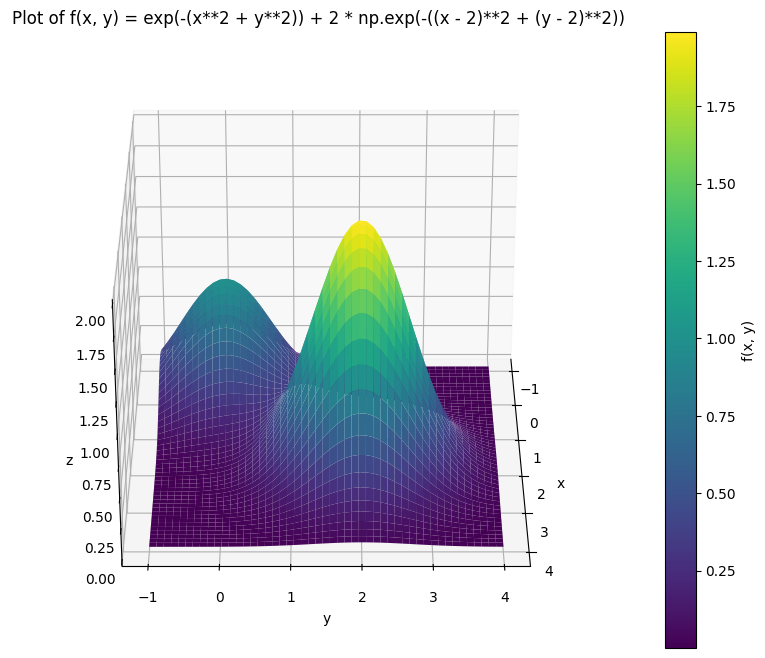


Hill Climbing Results (starting near (0, 0)):
Maximum found at (x, y) = (0.0000, -0.0000)
Maximum value f(x, y) = 1.0007

Hill Climbing Results (starting near (2, 2)):
Maximum found at (x, y) = (2.0000, 2.0000)
Maximum value f(x, y) = 2.0003


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# Define the function
def f(x, y):
    return np.exp(-(x**2 + y**2)) + 2 * np.exp(-((x - 2)**2 + (y - 2)**2))

# 1. Plot f(x, y) on x, y, z plane
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Create the meshgrid
num1 = 50
x = np.linspace(-1, 4, num1)  # Adjusted range for better visualization
y = np.linspace(-1, 4, num1)  # Adjusted range for better visualization
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# Plot the surface
surf = ax.plot_surface(X, Y, Z, cmap='viridis')
fig.colorbar(surf, ax=ax, label='f(x, y)')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title('Plot of f(x, y) = exp(-(x**2 + y**2)) + 2 * np.exp(-((x - 2)**2 + (y - 2)**2))')

# 2. Rotate it around the line x, y = 0, 0 and save the animation
def rotate(angle):
    ax.view_init(azim=angle)

angle_range = np.linspace(0, 360, 120)
ani = FuncAnimation(fig, rotate, frames=angle_range, interval=50)

# Save the animation to GIF
gif_file = 'fxy-animate.gif'
ani.save(gif_file, writer='pillow')
print(f"Animation saved to {gif_file}")

# Save the animation to MP4 (requires ffmpeg)
mp4_file = 'fxy-animate.mp4'
try:
    ani.save(mp4_file, writer='ffmpeg', fps=30)
    print(f"Animation saved to {mp4_file}")
except Exception as e:
    print(f"Error saving MP4 animation: {e}")
    print("Please ensure ffmpeg is installed if you want to save as MP4.")

plt.show()

# 3. Python program using Hill climbing algorithm to find the maxima of the function
def hill_climbing(func, start_point, step_size, num_iterations):
    current_point = np.array(start_point)
    current_value = func(current_point[0], current_point[1])

    for i in range(num_iterations):
        neighbors = []
        for j in range(2):  # For x and y
            # Explore positive and negative steps for each dimension
            delta = np.zeros(2)
            delta[j] = step_size
            neighbors.append(current_point + delta)
            neighbors.append(current_point - delta)

        best_neighbor = None
        best_neighbor_value = current_value

        for neighbor in neighbors:
            neighbor_value = func(neighbor[0], neighbor[1])
            if neighbor_value > best_neighbor_value:
                best_neighbor_value = neighbor_value
                best_neighbor = neighbor

        if best_neighbor is not None:
            current_point = best_neighbor
            current_value = best_neighbor_value
        else:
            # If no better neighbor is found, we might be at a local maximum
            break

    return current_point, current_value

# Hill climbing parameters
# start_point_1 = [0.0, 0.0]  # Starting near the first peak
# start_point_2 = [2.0, 2.0]  # Starting near the second peak

start_point_1 = [0.1, 0.2]  # Starting near the first peak
start_point_2 = [2.3, 2.5]  # Starting near the second peak

step_size = 0.01
num_iterations = 1000

# Run the hill climbing algorithm
max_point_1, max_value_1 = hill_climbing(f, start_point_1, step_size, num_iterations)
print("\nHill Climbing Results (starting near (0, 0)):")
print(f"Maximum found at (x, y) = ({max_point_1[0]:.4f}, {max_point_1[1]:.4f})")
print(f"Maximum value f(x, y) = {max_value_1:.4f}")

# Run the hill climbing algorithm with the second starting point
max_point_2, max_value_2 = hill_climbing(f, start_point_2, step_size, num_iterations)
print("\nHill Climbing Results (starting near (2, 2)):")
print(f"Maximum found at (x, y) = ({max_point_2[0]:.4f}, {max_point_2[1]:.4f})")
print(f"Maximum value f(x, y) = {max_value_2:.4f}")

## Gradient Descent

###Types of Gradient Descent Algorithms

- stochastic gradient descent,
- adaptive gradient descent,
- momentum gradient descent.

The ideas behind the Gradient Descent is an iterative optimization algorithm to find the minimum of a differentiable cost function $J(\theta)$ by adjusting model parameters $\theta$.

$$
\theta^{(t+1)} = \theta^{(t)} - \alpha \nabla J(\theta^{(t)})
$$

where $\alpha$ is the learning rate, and $\nabla J(\theta^{(t)})$ is the gradient of the cost function at iteration $t$.



### Gradient Descent Illustration

Let $f(x) = -x^2 + 5x + 2$.

$f'(x) = \frac{d}{dx}(-x^2 + 5x + 2) = -2x + 5$.

This derivative represents the gradient (slope) in one dimension.

We want to find minimum of this function using Gradient Descent algorithm.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# # Define the function
# def f(x):
#     return -x**2 + 5*x + 2

# # Define the derivative of the function
# def df(x):
#     return -2*x + 5

# Define the function
def f(x):
    return np.exp(-(x**2)) + 2 * np.exp(-((x - 2.0)**2))


def df(x):
    return -2 * x * np.exp(-(x**2)) - 4 * (x - 2.0) * np.exp(-((x - 2.0)**2))


# Gradient Ascent parameters
learning_rate = 0.1
num_iterations = 100


In [ ]:
# TODO. Try different initial values.

# initial_x = 0  # Starting point (you can try different starting points)

initial_x = 100

# initial_x = -100

# Already at maxima
# initial_x = 2.5

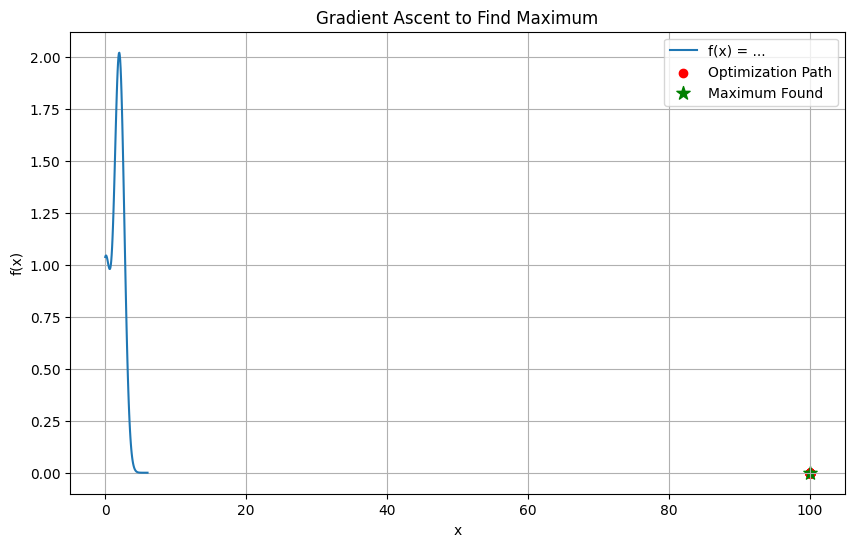

Maximum found at x = 100.0000, f(x) = 0.0000


In [ ]:

x_values = [initial_x]
y_values = [f(initial_x)]

# Gradient Ascent algorithm
current_x = initial_x
for i in range(num_iterations):
    gradient = df(current_x)
    current_x = current_x + learning_rate * gradient  # Plus for ascent
    x_values.append(current_x)
    y_values.append(f(current_x))

# Plotting the function and the optimization path
x_plot = np.linspace(0, 6, 100)
y_plot = f(x_plot)

plt.figure(figsize=(10, 6))
plt.plot(x_plot, y_plot, label='f(x) = ...')
plt.scatter(x_values, y_values, color='red', marker='o', label='Optimization Path')
plt.scatter(x_values[-1], y_values[-1], color='green', marker='*', s=100, label='Maximum Found')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Gradient Ascent to Find Maximum')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum found at x = {x_values[-1]:.4f}, f(x) = {y_values[-1]:.4f}")

### Stochastic Gradient Ascent (Simplified)

In a nutshell, this is Gradient Ascent algorithm with stochastic approach, a subset of Stochastic approximation

### Weights and Biases (in Simple Linear Model)

Note: Refer to Neural Networks materials for more information about Weights and Biases

Simple Linear Model is often trained with SGD.

For a model trying to make a prediction $\hat{y}$ based on input features $x_1, x_2, ..., x_n$, the calculation might look like this:

$\hat{y} = (w_1 \times x_1) + (w_2 \times x_2) + ... + (w_n \times x_n) + b$

Where:

* $w_1, w_2, ..., w_n$ are the weights associated with each feature.
* $x_1, x_2, ..., x_n$ are the values of the input features for a given data point.
* $b$ is the bias term.

The SGD algorithm's job is to find the optimal values for $w_1, w_2, ..., w_n$, and $b$ that lead to the most accurate predictions on the training data (by minimizing the chosen loss function).


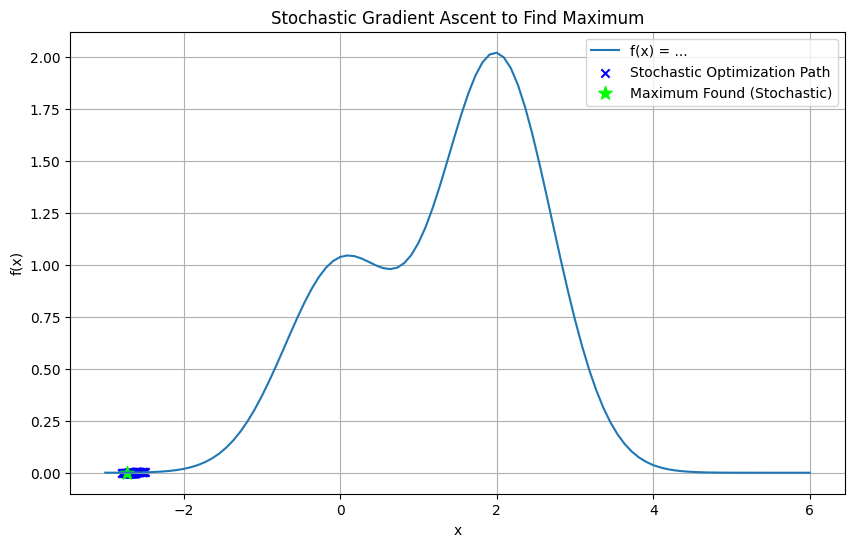

Maximum found (Stochastic) at x = -2.7184, f(x) = 0.0006


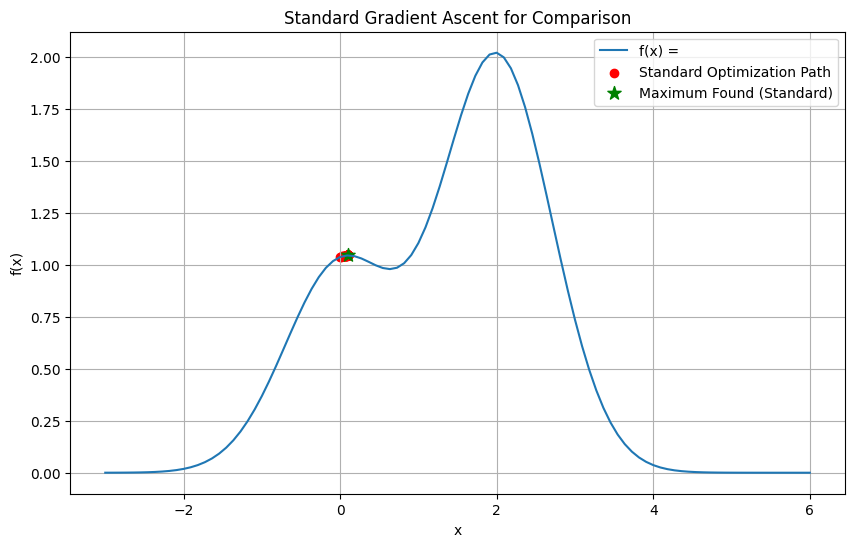

Maximum found (Standard) at x = 0.1060, f(x) = 1.0442


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

# # Define the function
# def f(x):
#     return -x**2 + 5*x + 2

# # Define the derivative of the function
# def df(x):
#     return -2*x + 5


# Define the function
def f(x):
    return np.exp(-(x**2)) + 2 * np.exp(-((x - 2.0)**2))


def df(x):
    return -2 * x * np.exp(-(x**2)) - 4 * (x - 2.0) * np.exp(-((x - 2.0)**2))


# Stochastic Gradient Ascent parameters
learning_rate = 0.1
num_iterations = 100

# initial_x = 0  # Starting point
initial_x = -2.5  # Starting point

x_values = [initial_x]
y_values = [f(initial_x)]

# Stochastic Gradient Ascent algorithm
current_x = initial_x
for i in range(num_iterations):
    gradient = df(current_x)

    # Introduce a small random perturbation to the gradient
    # This is a simplified way to mimic the stochastic nature
    random_factor = random.uniform(-0.5, 0.5)  # Adjust range as needed
    perturbed_gradient = gradient + random_factor

    current_x = current_x + learning_rate * perturbed_gradient  # Plus for ascent
    x_values.append(current_x)
    y_values.append(f(current_x))

# Plotting the function and the optimization path
x_plot = np.linspace(-3, 6, 100)
y_plot = f(x_plot)

plt.figure(figsize=(10, 6))
plt.plot(x_plot, y_plot, label='f(x) = ...')
plt.scatter(x_values, y_values, color='blue', marker='x', label='Stochastic Optimization Path')
plt.scatter(x_values[-1], y_values[-1], color='lime', marker='*', s=100, label='Maximum Found (Stochastic)')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Stochastic Gradient Ascent to Find Maximum')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum found (Stochastic) at x = {x_values[-1]:.4f}, f(x) = {y_values[-1]:.4f}")

# Compare with standard Gradient Ascent (original code)
learning_rate_gd = 0.1
num_iterations_gd = 100
initial_x_gd = 0
x_values_gd = [initial_x_gd]
y_values_gd = [f(initial_x_gd)]
current_x_gd = initial_x_gd
for i in range(num_iterations_gd):
    gradient_gd = df(current_x_gd)
    current_x_gd = current_x_gd + learning_rate_gd * gradient_gd
    x_values_gd.append(current_x_gd)
    y_values_gd.append(f(current_x_gd))

plt.figure(figsize=(10, 6))
plt.plot(x_plot, y_plot, label='f(x) = ')
plt.scatter(x_values_gd, y_values_gd, color='red', marker='o', label='Standard Optimization Path')
plt.scatter(x_values_gd[-1], y_values_gd[-1], color='green', marker='*', s=100, label='Maximum Found (Standard)')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Standard Gradient Ascent for Comparison')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum found (Standard) at x = {x_values_gd[-1]:.4f}, f(x) = {y_values_gd[-1]:.4f}")

# Model Evaluation (and its Metrics)

Evaluation metrics provided by scikit-learn: https://scikit-learn.org/stable/api/sklearn.metrics.html

## Confusion Matrix (Error Matrix / Matching Matrix)

### Introduction to Confusion Matrix


A Confusion Matrix is a table that summarizes the performance of a classification model by comparing the model's predictions to the actual true labels of the data.

For Binary Classification such as SGD Classifier, the confusion matrix contains two classes (True or False)

For multi-class classification, the confusion matrix is a m x n matrix.

Confusion Matrix is used in Error Analysis, Performance Evaluation, Model Comparison, Threshold Tuning.

`sklearn.metrics.confusion_matrix` can be used to generate confusion matrix after training a model.

## Metrics for Model Evaluation

* Accuracy:
 - The first metric to look at
 - Measures the overall correctness of the model's predictions.

$$
   \text{Accuracy} = \frac{TP + TN}{TP + TN + FP + FN}
$$


* Precision:

 - Example: We don't want to flag legitimate emails as spam.
 - Indicates the proportion of correctly identified positive instances among all instances the model predicted as positive.

   $$
   \text{Precision} = \frac{TP}{TP + FP}
   $$

* Recall: Indicates the proportion of correctly identified positive instances among all actual positive instances.

   $$
   \text{Recall} = \frac{TP}{TP + FN}
   $$

* F1-score: the harmonic mean of precision and recall.

   $$
   F_1\text{-score} = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}
   $$


What F1-score signify and why it is useful?
  - The F1 Score is a valuable metric for evaluating the overall performance of a classification model
  - A high F1 Score (closer to 1) indicates that the model has a good balance between precision and recall.
  - A low F1 Score (closer to 0) suggests that the model has either low precision or low recall, or both.
  -  The F1 Score is particularly useful when dealing with imbalanced datasets

---

* ROC Curve: shows the trade-off between the true positive rate and the false positive rates.

   * True Positive Rate (TPR) = Recall = $\frac{TP}{TP + FN}$
   * False Positive Rate (FPR) = $\frac{FP}{FP + TN}$
   The ROC curve plots TPR against FPR at various threshold settings.

ROC is designed for evaluating the performance of binary classifiers ('5' or not '5'). Use ROC when dealing with imblanced datasets

---

* K-fold cross-validation: evaluate a model's generalisation ability by training and testing it on different subsets of the data.

   If $M_i$ is the performance metric on the $i$-th fold, then the cross-validation result is often reported as:
   $$
   \text{Average Performance} = \frac{1}{K} \sum_{i=1}^{K} M_i
   $$

where,

| Abbreviation | Full Name      | Description                                                  |
| :----------- | :------------- | :----------------------------------------------------------- |
| TP           | True Positive  | The model correctly predicted the positive class.            |
| FP           | False Positive | The model incorrectly predicted the positive class (it was negative). |
| FN           | False Negative | The model incorrectly predicted the negative class (it was positive). |
| TN           | True Negative  | The model correctly predicted the negative class.            |

### Table of Confusion

https://en.wikipedia.org/wiki/Confusion_matrix#Table_of_confusion

## Confusion Matrix & Metrics for SGDClassifier


Confusion Matrix for MNIST ("5" vs "not 5"):
[[8707  401]
 [ 107  785]]


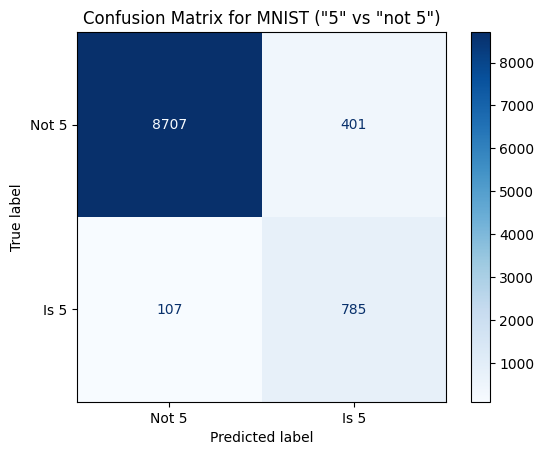

In [ ]:

# Load the MNIST dataset from openml.org
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
X_mnist, y_mnist = mnist["data"], mnist["target"] # Separates the features (pixel data) and the target labels (digits)

# Convert the labels to unsigned 8-bit integers
y_mnist = y_mnist.astype(np.uint8)

# Create target labels for a binary classification problem: is the digit 5 or not?
y_train_5_mnist = (y_mnist[:60000] == 5) # True for all '5's in the training set, False otherwise
y_test_5_mnist = (y_mnist[60000:] == 5)   # True for all '5's in the test set, False otherwise

# Split the dataset into training and testing sets (first 60000 for training, next 10000 for testing)
X_train_mnist, X_test_mnist = X_mnist[:60000], X_mnist[60000:]

# Initialize the Stochastic Gradient Descent Classifier
sgd_clf_mnist = SGDClassifier(max_iter=1000, tol=1e-3, random_state=42)
# max_iter: maximum number of iterations (epochs) over the training data
# tol: tolerance for the stopping criterion (when the loss decreases by less than tol, training stops)
# random_state: seed for the random number generator to ensure reproducibility

# Train the SGDClassifier using the training data and the binary labels (is it 5 or not?)
sgd_clf_mnist.fit(X_train_mnist, y_train_5_mnist)

# Make predictions on the test set
y_pred_mnist = sgd_clf_mnist.predict(X_test_mnist)

# Calculate the confusion matrix to evaluate the classifier's performance
# It compares the true test labels (y_test_5_mnist) with the predicted labels (y_pred_mnist)
cm_mnist = confusion_matrix(y_test_5_mnist, y_pred_mnist)

# Print the confusion matrix
print("\nConfusion Matrix for MNIST (\"5\" vs \"not 5\"):")
print(cm_mnist)
# The output will be a 2x2 matrix:
# [[TN, FP],
#  [FN, TP]]
# Where:
# TN: True Negatives (correctly classified as not 5)
# FP: False Positives (incorrectly classified as 5)
# FN: False Negatives (incorrectly classified as not 5)
# TP: True Positives (correctly classified as 5)

# Create a ConfusionMatrixDisplay object for a more visual representation
disp_mnist = ConfusionMatrixDisplay(confusion_matrix=cm_mnist, display_labels=['Not 5', 'Is 5'])
# confusion_matrix: the confusion matrix array calculated above
# display_labels: labels to use for the x and y axes (in order of the classes)

# Plot the confusion matrix
disp_mnist.plot(cmap=plt.cm.Blues) # Uses a blue colormap for the visualization
plt.title("Confusion Matrix for MNIST (\"5\" vs \"not 5\")") # Sets the title of the plot
plt.show() # Displays the plot



Accuracy of the model: 0.9492
Precision of the model (for '5'): 0.6619
Recall of the model (for '5'): 0.8800
F1-score of the model (for '5'): 0.7555

AUC of the ROC Curve: 0.9666


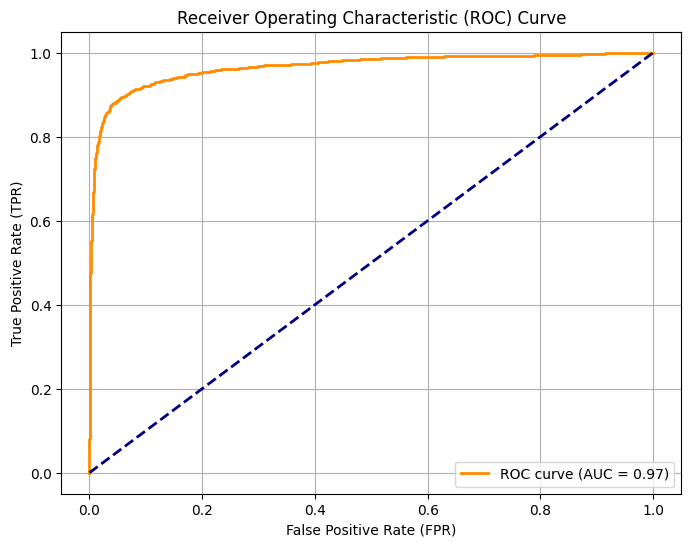


K-fold Cross-Validation Accuracy Scores (for 3 folds):
Fold 1: 0.9669
Fold 2: 0.9163
Fold 3: 0.9678
Mean Accuracy: 0.9503
Standard Deviation of Accuracy: 0.0241


In [ ]:

# Print Accuracy of the model
accuracy = accuracy_score(y_test_5_mnist, y_pred_mnist)
print(f"\nAccuracy of the model: {accuracy:.4f}")

# Print Precision and Recall
precision = precision_score(y_test_5_mnist, y_pred_mnist)
recall = recall_score(y_test_5_mnist, y_pred_mnist)
print(f"Precision of the model (for '5'): {precision:.4f}")
print(f"Recall of the model (for '5'): {recall:.4f}")

# Print F1-score
f1 = f1_score(y_test_5_mnist, y_pred_mnist)
print(f"F1-score of the model (for '5'): {f1:.4f}")

# Plot/print ROC Curve
# Get decision scores from the classifier (needed for ROC curve)
y_scores_mnist = sgd_clf_mnist.decision_function(X_test_mnist)

# Calculate False Positive Rate (FPR), True Positive Rate (TPR), and thresholds
fpr, tpr, thresholds = roc_curve(y_test_5_mnist, y_scores_mnist)

# Calculate the Area Under the ROC Curve (AUC)
roc_auc = roc_auc_score(y_test_5_mnist, y_scores_mnist)
print(f"\nAUC of the ROC Curve: {roc_auc:.4f}")

# Plot the ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Perform K-fold cross-validation
n_folds = 3 # You can change the number of folds
stratified_kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
accuracy_scores = cross_val_score(sgd_clf_mnist, X_train_mnist, y_train_5_mnist, cv=stratified_kfold, scoring='accuracy')

print(f"\nK-fold Cross-Validation Accuracy Scores (for {n_folds} folds):")
for i, score in enumerate(accuracy_scores):
    print(f"Fold {i+1}: {score:.4f}")
print(f"Mean Accuracy: {accuracy_scores.mean():.4f}")
print(f"Standard Deviation of Accuracy: {accuracy_scores.std():.4f}")

## Classification Report

ref. https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html

In [ ]:

from sklearn.metrics import classification_report

# Generate the classification report
# metrics of reports depend on the models and features/target.
print(classification_report(y_test_5_mnist, y_pred_mnist))


              precision    recall  f1-score   support

       False       0.99      0.96      0.97      9108
        True       0.66      0.88      0.76       892

    accuracy                           0.95     10000
   macro avg       0.82      0.92      0.86     10000
weighted avg       0.96      0.95      0.95     10000



## Measuring Accuracy Using Cross-Validation

https://colab.research.google.com/github/ageron/handson-ml2/blob/master/03_classification.ipynb#scrollTo=huRCRV2JRp5i

# Setup (For Dataset Splitting)


In [ ]:
# Already imported libraries in the first section of this Notebook

# Part A: Split Dataset

## 1. Split a simple dataset.

In [ ]:
# Generate a simple dataset which has 20 samples.
X1, y1 = np.arange(40).reshape((20, 2)), range(20)
print('Data: \n X1 =')
print(X1)
print('Label: \n y1 = ',list(y1))

Data: 
 X1 =
[[ 0  1]
 [ 2  3]
 [ 4  5]
 [ 6  7]
 [ 8  9]
 [10 11]
 [12 13]
 [14 15]
 [16 17]
 [18 19]
 [20 21]
 [22 23]
 [24 25]
 [26 27]
 [28 29]
 [30 31]
 [32 33]
 [34 35]
 [36 37]
 [38 39]]
Label: 
 y1 =  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]


In [ ]:
X1.shape

(20, 2)

### a) split into train/test set

sklearn.model_selection.train_test_split(): Split arrays or matrices into random train and test subsets.



Ref: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

In [ ]:

from sklearn.model_selection import train_test_split

In [ ]:
# Parameters in train_test_split():

# test_size (float): the proportion of the dataset to include in the test split
# test_size (int): the absolute number of test samples
# random_state: shuffling applied to the data before applying the split.

X1_train, X1_test, y1_train, y1_test = train_test_split(
...     X1, y1, test_size=0.3, random_state=42)

In [ ]:
X1_train.shape # 14/20 = 0.7

(14, 2)

In [ ]:
X1_test.shape # 6/20 = 0.3 --> test_size = 0.3

(6, 2)

In [ ]:
X1_train # 14 training samples

array([[22, 23],
       [ 6,  7],
       [36, 37],
       [32, 33],
       [26, 27],
       [ 4,  5],
       [18, 19],
       [38, 39],
       [ 8,  9],
       [24, 25],
       [14, 15],
       [20, 21],
       [28, 29],
       [12, 13]])

The order of training instances has been randomly changed, as Machine Learning algorithms may be sensitive to the order.

In [ ]:
y1_train # 14 training labels

[11, 3, 18, 16, 13, 2, 9, 19, 4, 12, 7, 10, 14, 6]

In [ ]:
X1_test # 6 test samples

array([[ 0,  1],
       [34, 35],
       [30, 31],
       [ 2,  3],
       [16, 17],
       [10, 11]])

In [ ]:
y1_test # 6 test labels

[0, 17, 15, 1, 8, 5]

### b) split into train/validation/test sets

Furthur split the training set in above example into a training set and a test set.

In [ ]:
# "tvt: test/validation/test
X1_train_tvt, X1_val_tvt, y1_train_tvt, y1_val_tvt = train_test_split(
...     X1_train, y1_train, test_size=0.2, random_state=42) # X1_train has 14 samples

In [ ]:
X1_train_tvt.shape # 4 samples in training set

(11, 2)

In [ ]:
X1_val_tvt.shape # 3 samples in validation set: 14*0.2=2.8

(3, 2)

## 2. Split MNIST dataset

**Warning:** since Scikit-Learn 0.24, `fetch_openml()` returns a Pandas `DataFrame` by default. To avoid this and keep the same code as in the book, we use `as_frame=False`.


The MNIST dataset is actually already split into a training set (the first 60,000
images) and a test set (the last 10,000 images):

In [ ]:
from sklearn.datasets import fetch_openml

# Download version ONE of the dataset mnist_784
mnist = fetch_openml('mnist_784', version=1, as_frame=False)

In [ ]:
X, y = mnist["data"], mnist["target"]
X.shape # all digit images in the dataset

(70000, 784)

In [ ]:
y.shape

(70000,)

### Step1: split the training set into training / test set

In [ ]:
X2_train, X2_test, y2_train, y2_test = train_test_split(
...     X, y, test_size=0.4, random_state=42)

In [ ]:
X2_train.shape

(42000, 784)

In [ ]:
X2_test.shape # 28000/70000 = 0.4 (test_size = 0.4)

(28000, 784)

### Step2: furthur split the training set in above example into training and validation set.

Then the whole dataset will be split in to training/validation/test set.

In [ ]:
X2_train_tvt, X2_valid_tvt, y2_train_tvt, y2_valid_tvt = train_test_split(
...     X2_train, y2_train, test_size=0.2, random_state=42)

In [ ]:
X2_train_tvt.shape

(33600, 784)

In [ ]:
X2_valid_tvt.shape #8400/42000 = 0.2 (test_size = 0.2)

(8400, 784)

# Part B: Evaluation Metrics

# Training a Binary Classifier

Classify digit 5 and non-5

The MNIST dataset is actually already split into a training set (the first 60,000 images) and a test set (the last 10,000 images)

In [ ]:
X_train, X_test, y_train, y_test = X[:60000], X[60000:], y[:60000], y[60000:] # split into training/test set

In [ ]:
y_train_5 = (y_train == 5)
y_test_5 = (y_test == 5)

In [ ]:
print('X_train.shape:', X_train.shape)
print('y_train_5.shape:',y_train_5.shape)

X_train.shape: (60000, 784)
y_train_5.shape: (60000,)


In [ ]:
y_train_5[:10] # Check training labels

array([ True, False, False, False, False, False, False, False, False,
       False])

In [ ]:
from sklearn.linear_model import SGDClassifier

# Initialze a Stochastic Gradient Descent Classifier
sgd_clf = SGDClassifier(max_iter=1000, tol=1e-3, random_state=42)
sgd_clf.fit(X_train, y_train_5)

SGDClassifier(random_state=42)

In [ ]:
some_digit = X[0]

In [ ]:
# predict the class label for the data point (some_digit).
sgd_clf.predict([some_digit])

NameError: name 'sgd_clf' is not defined

In [ ]:
print(y[0])# check its label... number 5! Correct!

5


In [ ]:
sgd_clf.predict([X[1]])

array([False])

In [ ]:
print(y[1]) # the label is ... number 0

0


# Performance Measures

## Measuring Accuracy Using Cross-Validation

In [ ]:
from sklearn.model_selection import cross_val_score

# performs the cross-validation.
# cv = 3 is the number of folds as in K-fold cross-validation
cross_val_score(sgd_clf, X_train, y_train_5, cv=3, scoring="accuracy")

array([0.95035, 0.96035, 0.9604 ])

In [ ]:
from sklearn.model_selection import cross_val_predict

y_train_pred = cross_val_predict(sgd_clf, X_train, y_train_5, cv=3)

#### cross_val_score() v.s. cross_val_predict()

cross_val_score():
Evaluate a score by cross-validation.

cross_val_predict(): generates cross-validated estimates for each input data point.

#### Confusion Matrix:

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_train_5, y_train_pred)

array([[53892,   687],
       [ 1891,  3530]])

In [ ]:
y_train_perfect_predictions = y_train_5  # pretend we reached perfection
confusion_matrix(y_train_5, y_train_perfect_predictions)

array([[54579,     0],
       [    0,  5421]])

#### Precision,  recall, and f1-score

In [ ]:
from sklearn.metrics import precision_score, recall_score

precision_score(y_train_5, y_train_pred)

0.8370879772350012

In [ ]:
cm = confusion_matrix(y_train_5, y_train_pred)
cm[1, 1] / (cm[0, 1] + cm[1, 1])

0.8370879772350012

In [ ]:
recall_score(y_train_5, y_train_pred)

0.6511713705958311

In [ ]:
cm[1, 1] / (cm[1, 0] + cm[1, 1])

0.6511713705958311

In [ ]:
from sklearn.metrics import f1_score

f1_score(y_train_5, y_train_pred)

0.7325171197343846

In [ ]:
cm[1, 1] / (cm[1, 1] + (cm[1, 0] + cm[0, 1]) / 2)

0.7325171197343847

### ROC curves

In [ ]:
# Receiver Operating Characteristic (ROC) curve
from sklearn.metrics import roc_curve

#False Positive Rate, True Positive Rate, thresholds
fpr, tpr, thresholds = roc_curve(y_train_5, y_scores)

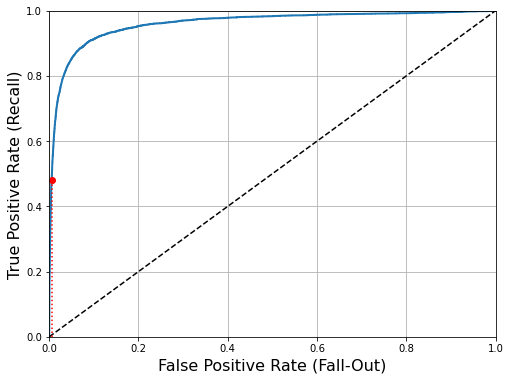

In [ ]:
def plot_roc_curve(fpr, tpr, label=None):
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--') # dashed diagonal
    plt.axis([0, 1, 0, 1])                                    # Not shown in the book
    plt.xlabel('False Positive Rate (Fall-Out)', fontsize=16) # Not shown
    plt.ylabel('True Positive Rate (Recall)', fontsize=16)    # Not shown
    plt.grid(True)                                            # Not shown

plt.figure(figsize=(8, 6))                                    # Not shown
plot_roc_curve(fpr, tpr)
fpr_90 = fpr[np.argmax(tpr >= recall_90_precision)]           # Not shown
plt.plot([fpr_90, fpr_90], [0., recall_90_precision], "r:")   # Not shown
plt.plot([0.0, fpr_90], [recall_90_precision, recall_90_precision], "r:")  # Not shown
plt.plot([fpr_90], [recall_90_precision], "ro")               # Not shown
#save_fig("roc_curve_plot")                                    # Not shown
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_train_5, y_scores)

0.9604938554008616

**Note**: we set `n_estimators=100` to be future-proof since this will be the default value in Scikit-Learn 0.22.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
forest_clf = RandomForestClassifier(n_estimators=100, random_state=42)
y_probas_forest = cross_val_predict(forest_clf, X_train, y_train_5, cv=3,
                                    method="predict_proba")

In [ ]:
y_scores_forest = y_probas_forest[:, 1] # score = proba of positive class
fpr_forest, tpr_forest, thresholds_forest = roc_curve(y_train_5,y_scores_forest)

Saving figure roc_curve_comparison_plot


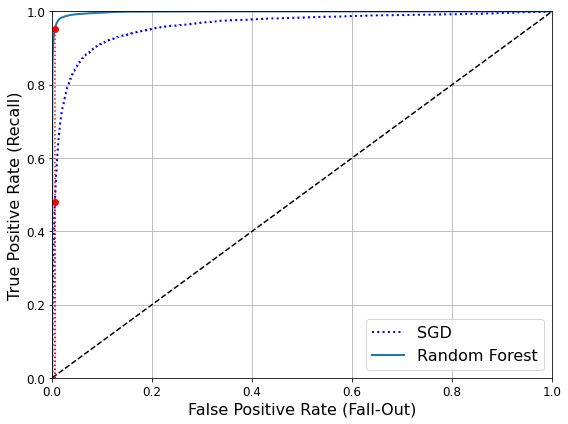

In [ ]:
recall_for_forest = tpr_forest[np.argmax(fpr_forest >= fpr_90)]

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, "b:", linewidth=2, label="SGD")
plot_roc_curve(fpr_forest, tpr_forest, "Random Forest")
plt.plot([fpr_90, fpr_90], [0., recall_90_precision], "r:")
plt.plot([0.0, fpr_90], [recall_90_precision, recall_90_precision], "r:")
plt.plot([fpr_90], [recall_90_precision], "ro")
plt.plot([fpr_90, fpr_90], [0., recall_for_forest], "r:")
plt.plot([fpr_90], [recall_for_forest], "ro")
plt.grid(True)
plt.legend(loc="lower right", fontsize=16)
save_fig("roc_curve_comparison_plot")
plt.show()

In [ ]:
roc_auc_score(y_train_5, y_scores_forest)

0.9983436731328145

In [ ]:
y_train_pred_forest = cross_val_predict(forest_clf, X_train, y_train_5, cv=3)
precision_score(y_train_5, y_train_pred_forest)

0.9905083315756169

In [ ]:
recall_score(y_train_5, y_train_pred_forest)

0.8662608374838591

# k-Nearest Neighbors (k-NN)

## What is k-NN

The k-Nearest Neighbors algorithm (k-NN) is a non-parametric supervised learning method used for classification and regression that classifies or predicts the value of a new data point based on the majority class or average value of its 'k' closest training examples.


## Example of k-NN

Let's say we want to classify if a person likes a certain type of music (Pop or Classical) based on their age and the number of concerts they've attended. We have some data on other people:

| Age | Concerts Attended | Music Preference |
| :-- | :---------------- | :--------------- |
| 25  | 5                 | Pop              |
| 30  | 2                 | Classical        |
| 22  | 7                 | Pop              |
| 40  | 1                 | Classical        |
| 28  | 4                 | Pop              |
| 35  | 3                 | Classical        |

Now, we have a new person who is 32 years old and has attended 3 concerts. We want to predict their music preference using k-NN with k=3.

Calculate the distance: We calculate the distance (e.g., Euclidean distance) between the new person's data point (32, 3) and all the other data points.


Find the k-nearest neighbors: We identify the 3 people with the smallest distances to the new person. Let's say these are:
Person 2: (30, 2) - Classical
Person 6: (35, 3) - Classical
Person 5: (28, 4) - Pop


Majority vote: Among these 3 neighbors, two prefer Classical music and one prefers Pop. Therefore, using k-NN with k=3, we would predict that the new person also prefers Classical music.

## "Birds of a feather flock together"

The underlying logic/idea behind k-NN is
- Similarity in Feature Space
- Neighborhood Conglomeration
- Shared Class Labels

https://i1.pickpik.com/photos/76/607/591/bird-wildlife-flight-water-preview.jpg

## Applications of k-NN

- Anomaly Detection
- Spam Detection
- Image Recognition
- Video Surveillance
- Handwriting Recognition
- Credit Scoring
- Recommendation Systems
- Medical Diagnosis

## Visualisation for k = 1, 2, 3

For k=1, the predicted class for x is: +. Distance to class '-' is: 1.00, Distance to class '+' is: 1.00
For k=2, the predicted class for x is: +. Distance to class '-' is: 1.00, Distance to class '+' is: 1.00
For k=3, the predicted class for x is: -. Distance to class '-' is: 1.00, Distance to class '+' is: 1.00


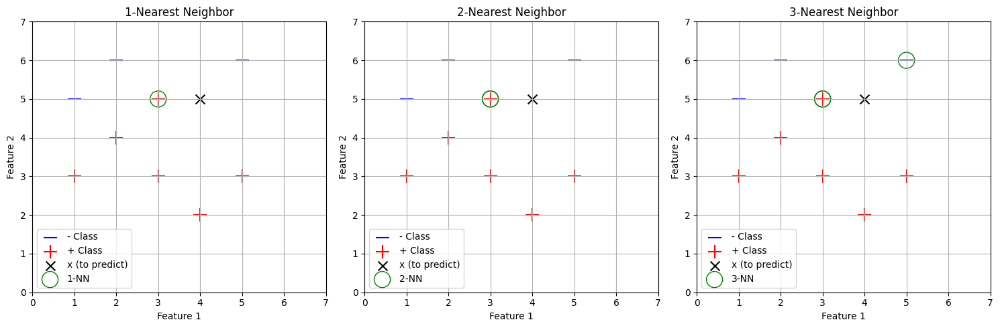

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

# Define the data points and their classes based on the image
data = np.array([
    [1, 3, 1],  # + (class 1)
    [2, 4, 1],  # + (class 1)
    [3, 3, 1],  # + (class 1)
    [4, 2, 1],  # + (class 1)
    [3, 5, 1],  # + (class 1)
    [5, 3, 1],  # + (class 1)
    [1, 5, 0],  # - (class 0)
    [2, 6, 0],  # - (class 0)
    [3, 5, 0],  # - (class 0)
    [5, 6, 0]   # - (class 0)
])

# The data point 'x' for which we want to predict the class
x_point = np.array([4, 5])

# Separate features (coordinates) and labels (classes)
X = data[:, :2]
y = data[:, 2]

# Separate data by class
X_minus = X[y == 0]
X_plus = X[y == 1]

# Function to calculate Euclidean distance
def euclidean_distance(point1, point2):
    return np.sqrt(np.sum((np.array(point1) - np.array(point2))**2))

# Function to predict the class using k-NN and return distances to neighbors
def predict_knn_with_distances(k, train_data, train_labels, test_point):
    distances = [euclidean_distance(test_point, data_point) for data_point in train_data]
    k_nearest_indices = np.argsort(distances)[:k]
    k_nearest_labels = train_labels[k_nearest_indices]
    class_counts = Counter(k_nearest_labels)
    prediction = class_counts.most_common(1)[0][0]
    nearest_distances = np.sort(distances)[:k]
    return prediction, k_nearest_indices, nearest_distances

# Values of k to iterate through
k_values = [1, 2, 3]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, k in enumerate(k_values):
    ax = axes[i]

    # Predict and get neighbors' indices and distances
    prediction, neighbor_indices, nearest_distances = predict_knn_with_distances(k, X, y, x_point)
    predicted_class = '+' if prediction == 1 else '-'
    print(f"For k={k}, the predicted class for x is: {predicted_class}", end="")

    distance_to_nearest_minus = float('inf')
    if len(X_minus) > 0:
        distances_to_minus = [euclidean_distance(x_point, minus_point) for minus_point in X_minus]
        distance_to_nearest_minus = min(distances_to_minus)

    distance_to_nearest_plus = float('inf')
    if len(X_plus) > 0:
        distances_to_plus = [euclidean_distance(x_point, plus_point) for plus_point in X_plus]
        distance_to_nearest_plus = min(distances_to_plus)

    print(f". Distance to class '-' is: {distance_to_nearest_minus:.2f}, Distance to class '+' is: {distance_to_nearest_plus:.2f}")

    # Plot the data points with bigger markers
    ax.scatter(X[y == 0][:, 0], X[y == 0][:, 1], marker='_', color='blue', label='- Class', s=200)
    ax.scatter(X[y == 1][:, 0], X[y == 1][:, 1], marker='+', color='red', label='+ Class', s=200)
    ax.scatter(x_point[0], x_point[1], marker='x', color='black', s=100, label='x (to predict)')

    # Highlight the k-nearest neighbors
    neighbor_points = X[neighbor_indices]
    ax.scatter(neighbor_points[:, 0], neighbor_points[:, 1], facecolors='none', edgecolors='green', s=300, linewidth=1, label=f'{k}-NN')

    ax.set_title(f'{k}-Nearest Neighbor')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.legend()
    ax.grid(True)
    ax.set_xlim(0, 7)
    ax.set_ylim(0, 7)

plt.tight_layout()
plt.show()

## Brute-force the optimal 'k'

For k = 1, accuracy = 0.73%
For k = 3, accuracy = 0.87%
For k = 5, accuracy = 0.80%
For k = 7, accuracy = 0.82%
For k = 9, accuracy = 0.83%
For k = 11, accuracy = 0.85%
For k = 13, accuracy = 0.83%
For k = 15, accuracy = 0.82%
For k = 17, accuracy = 0.83%
For k = 19, accuracy = 0.83%

Optimal value of k found: 3 with an accuracy of 0.87% on the validation set.


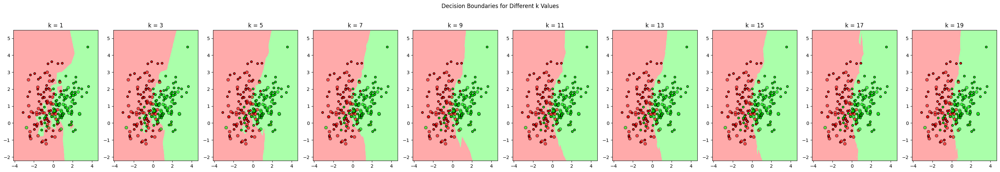

In [ ]:
# import numpy as np
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.model_selection import train_test_split
# from sklearn.datasets import make_classification
# from sklearn.metrics import accuracy_score

# # 1. Create a sample dataset
# # We'll create a synthetic dataset for classification
# X, y = make_classification(n_samples=200, n_features=2, n_informative=2,
#                            n_redundant=0, n_repeated=0, n_classes=2,
#                            n_clusters_per_class=1, random_state=42)

# # 2. Split the data into training and validation sets
# # We need a validation set to evaluate the performance for different k values
# X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

# # 3. Define the range of k values to try
# # We'll try k values from 1 to 20 (inclusive) with a step of 2, as seen in the image
# k_values = np.arange(1, 21, 2)

# # 4. Initialize variables to store the best k and the best accuracy
# best_k = None
# best_accuracy = 0.0

# # 5. Iterate through each k value and evaluate the model
# for k in k_values:
#     # Create a k-NN classifier with the current k
#     model = KNeighborsClassifier(n_neighbors=k)

#     # Train the model on the training data
#     model.fit(X_train, y_train)

#     # Make predictions on the validation data
#     y_pred = model.predict(X_val)

#     # Evaluate the accuracy of the model
#     accuracy = accuracy_score(y_val, y_pred)

#     # Print the accuracy for the current k
#     print(f"For k = {k}, accuracy = {accuracy:.2f}%")

#     # Update the best k and accuracy if the current accuracy is better
#     if accuracy > best_accuracy:
#         best_accuracy = accuracy
#         best_k = k

# # 6. Print the optimal k value and its accuracy
# print(f"\nOptimal value of k found: {best_k} with an accuracy of {best_accuracy:.2f}% on the validation set.")

# # --- Optional: Visualization of Decision Boundaries for different k ---
# import matplotlib.pyplot as plt
# from matplotlib.colors import ListedColormap

# cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
# cmap_bold = ListedColormap(['#FF0000', '#00FF00'])

# h = .02  # step size in the mesh

# plt.figure(figsize=(15, 5))

# for i, k in enumerate(k_values):
#     model = KNeighborsClassifier(n_neighbors=k)
#     model.fit(X_train, y_train)

#     # Plot the decision boundary. For that, we will assign a color to each
#     # point in the mesh [x_min, x_max]x[y_min, y_max].
#     x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
#     y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
#     xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
#                          np.arange(y_min, y_max, h))
#     Z = model.predict(np.c_[xx.ravel(), yy.ravel()])

#     # Put the result into a color plot
#     Z = Z.reshape(xx.shape)
#     plt.subplot(1, len(k_values) // 2 + 1, i + 1)
#     plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

#     # Plot also the training points
#     plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cmap_bold,
#                 edgecolor='k', s=20)
#     plt.scatter(X_val[:, 0], X_val[:, 1], c=y_val, cmap=cmap_bold,
#                 edgecolor='k', alpha=0.6, s=40, marker='o')
#     plt.xlim(xx.min(), xx.max())
#     plt.ylim(yy.min(), yy.max())
#     plt.title(f"k = {k}")

# plt.suptitle("Decision Boundaries for Different k Values", y=1.02)
# plt.tight_layout()
# plt.show()
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score

# 1. Create a sample dataset
X, y = make_classification(n_samples=200, n_features=2, n_informative=2,
                           n_redundant=0, n_repeated=0, n_classes=2,
                           n_clusters_per_class=1, random_state=42)

# 2. Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

# 3. Define the range of k values to try
k_values = np.arange(1, 21, 2)

# 4. Initialize variables to store the best k and the best accuracy
best_k = None
best_accuracy = 0.0

# 5. Iterate through each k value and evaluate the model
for k in k_values:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    accuracy = accuracy_score(y_val, y_pred)
    print(f"For k = {k}, accuracy = {accuracy:.2f}%")
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_k = k

# 6. Print the optimal k value and its accuracy
print(f"\nOptimal value of k found: {best_k} with an accuracy of {best_accuracy:.2f}% on the validation set.")

# --- Optional: Visualization of Decision Boundaries for different k ---
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
cmap_bold = ListedColormap(['#FF0000', '#00FF00'])

h = .02  # step size in the mesh

# Calculate the number of columns for the subplot grid
num_cols = len(k_values)
plt.figure(figsize=(num_cols * 3, 5)) # Adjust figure size based on the number of subplots

for i, k in enumerate(k_values):
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)

    # Plot the decision boundary.
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.subplot(1, num_cols, i + 1)
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot the training and validation points
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cmap_bold,
                edgecolor='k', s=20)
    plt.scatter(X_val[:, 0], X_val[:, 1], c=y_val, cmap=cmap_bold,
                edgecolor='k', alpha=0.6, s=40, marker='o')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title(f"k = {k}")

plt.suptitle("Decision Boundaries for Different k Values", y=1.02)
plt.tight_layout()
plt.show()

# k-Nearest Neighbors (k-NN) for MNIST Classification

Original Notebook: https://colab.research.google.com/github/vuhung16au/ACU/blob/main/ITEC203/Week06/ITEC203-Week6-Tutorial-KNN%20for%20MNIST%20Classification.ipynb#scrollTo=_LHMNFX-6m2w

## Load the dataset

In [ ]:
# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
mnist.keys()

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])

In [ ]:
mnist.data.shape

(70000, 784)

In [ ]:
X, y = mnist["data"], mnist["target"]

## Show some hand-writing digits

In [ ]:
# EXTRA (taken from the book Hands-on ML)
def plot_digits(instances, images_per_row=10, **options):
    size = 28
    images_per_row = min(len(instances), images_per_row)
    # This is equivalent to n_rows = ceil(len(instances) / images_per_row):
    n_rows = (len(instances) - 1) // images_per_row + 1

    # Append empty images to fill the end of the grid, if needed:
    n_empty = n_rows * images_per_row - len(instances)
    padded_instances = np.concatenate([instances, np.zeros((n_empty, size * size))], axis=0)

    # Reshape the array so it's organized as a grid containing 28×28 images:
    image_grid = padded_instances.reshape((n_rows, images_per_row, size, size))

    # Combine axes 0 and 2 (vertical image grid axis, and vertical image axis),
    # and axes 1 and 3 (horizontal axes). We first need to move the axes that we
    # want to combine next to each other, using transpose(), and only then we
    # can reshape:
    big_image = image_grid.transpose(0, 2, 1, 3).reshape(n_rows * size,
                                                         images_per_row * size)
    # Now that we have a big image, we just need to show it:
    plt.imshow(big_image, cmap = mpl.cm.binary, **options)
    plt.axis("off")

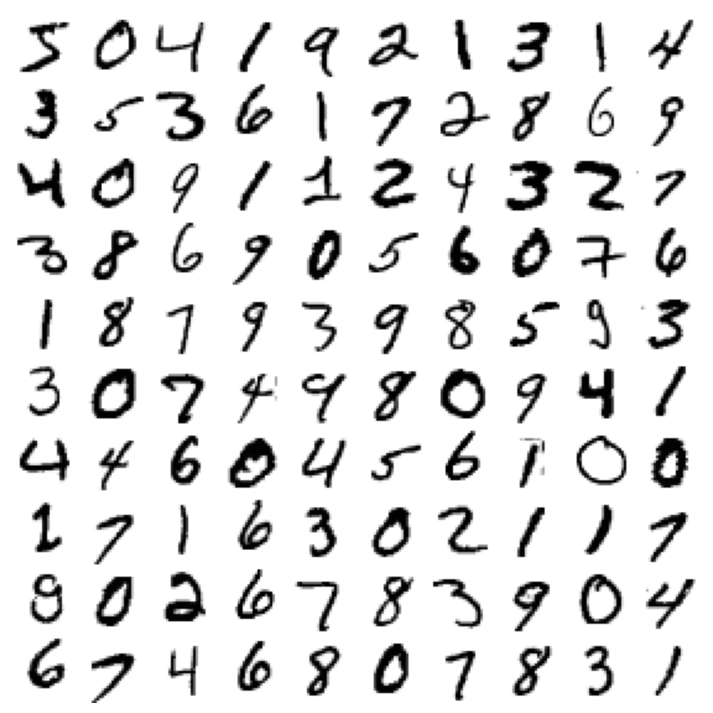

In [ ]:
plt.figure(figsize=(9,9))
example_images = X[:100]
plot_digits(example_images, images_per_row=10)
# save_fig("more_digits_plot")
plt.show()

## Split the Data into Train and Test Sets

The MNIST dataset is actually already split into a training set (the first 60,000 images) and a test set (the last 10,000 images):

In [ ]:
X_train, X_test, y_train, y_test = X[:60000], X[60000:], y[:60000], y[60000:]

## Split the Train Data into Train and Validation Sets

The two hyperparameters in KNN Classifier is the number of neighbors parameter k and the distance measure. In this case we are assuming Euclidian distance as the distance measure. The tunable parameter is k. To tune the optimal value of k we will use the validation data set.

In [ ]:
from sklearn.model_selection import train_test_split
trainData,valData,trainLabel,valLabel = train_test_split(X_train,y_train,test_size=0.1,random_state=84)

In [ ]:
print("training data points: {}".format(len(trainLabel)))
print("validation data points: {}".format(len(valLabel)))
print("testing data points: {}".format(len(y_test)))

training data points: 54000
validation data points: 6000
testing data points: 10000


## Select the best K with Train and Validation Sets

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

kVals = np.arange(1,20,2)

for k in kVals:

    # Use euclidean distance by default
    model = KNeighborsClassifier(n_neighbors=k)

    # use Manhattan distance
    # model = KNeighborsClassifier(n_neighbors=k, metric='manhattan')

    # Possible metrics (for k-NN classifier): chebyshev, minkowski (requires metric param 'p')

    model.fit(trainData,trainLabel)

    # evaluate the model and update the accuracies list
    score = model.score(valData, valLabel)
    print("k=%d, accuracy=%.2f%%" % (k, score * 100))


k=1, accuracy=97.48%
k=3, accuracy=97.62%
k=5, accuracy=97.28%
k=7, accuracy=97.10%
k=9, accuracy=97.03%
k=11, accuracy=97.03%
k=13, accuracy=96.77%
k=15, accuracy=96.60%
k=17, accuracy=96.43%
k=19, accuracy=96.20%


## Make Prediction on Test Set

In [ ]:
# choose k = 3
model = KNeighborsClassifier(n_neighbors=3)
model.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
predictions = model.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       980
           1       0.96      1.00      0.98      1135
           2       0.98      0.97      0.97      1032
           3       0.96      0.97      0.96      1010
           4       0.98      0.97      0.97       982
           5       0.97      0.96      0.96       892
           6       0.98      0.99      0.98       958
           7       0.96      0.96      0.96      1028
           8       0.99      0.94      0.96       974
           9       0.96      0.96      0.96      1009

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000



## Using Custom Classifier

Compare the accuracy when using custom classifiers:
https://colab.research.google.com/github/ageron/handson-ml2/blob/master/03_classification.ipynb#scrollTo=huRCRV2JRp5i

# Further Readings

1. https://en.wikipedia.org/wiki/Gradient_descent
2. https://en.wikipedia.org/wiki/Stochastic_gradient_descent
3. https://en.wikipedia.org/wiki/Hill_climbing
4. Scikit-learn examples: https://scikit-learn.org/stable/auto_examples/index.html
5. https://scikit-learn.org/stable/auto_examples/neighbors/plot_nca_classification.html#sphx-glr-auto-examples-neighbors-plot-nca-classification-py
6. https://scikit-learn.org/stable/auto_examples/neighbors/plot_classification.html#
7. (ML Hands-on book chapter 3 Notebook) https://colab.research.google.com/github/ageron/handson-ml2/blob/master/03_classification.ipynb#scrollTo=itj3Gh7oRp5g
8. (ML Hands-on book chapter 4 Notebook - Stochastic Gradient Descent)https://colab.research.google.com/github/vuhung16au/handson-ml2/blob/master/04_training_linear_models.ipynb#scrollTo=Bkvo4pzQkfDk

9. TODO: How to measure Performance in other models?

# Cross Validation

## What is Cross Validation
Cross-validation as a technique used in machine learning to compare different methods and evaluate their performance on unseen data.

## Cross Validation by tuning hyper-params
Cross-validation can be used to find the best value for a tuning parameter.

## Cross Validation by picking different ML algorithms
Cross-validation also helps compare the performance of different machine learning algorithms. By dividing the data into blocks and iteratively training and testing each algorithm on different subsets, we can observe how well each algorithm generalizes to unseen data.

## K-Fold Cross Validation
"K-Fold" in "K-Fold Cross Validation" refers to a cross-validation technique where the original dataset is divided into K equally sized (or as close to equal as possible) subsets or partitions, called folds.

For example, in 5-Fold Cross Validation (where K=5), the data is split into 5 folds. The model is trained and tested 5 times, each time using a different fold as the test set and the other four folds as the training set

Warning: The following cell takes time to run.

In [ ]:
import time

import numpy as np
from sklearn.datasets import fetch_openml
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score

# Load the MNIST dataset
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
X, y = mnist['data'], mnist['target']

# Convert labels to integers
y = y.astype(np.uint8)

# Create binary labels: True for '5', False for others
y_5 = (y == 5)

# Choose a classifier
model = LogisticRegression(solver='liblinear', random_state=42)

# Perform 10-fold stratified cross-validation
n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

accuracy_scores = []

start_time = time.time()

for train_index, test_index in skf.split(X, y_5):
    X_train_fold, X_test_fold = X[train_index], X[test_index]
    y_train_fold, y_test_fold = y_5[train_index], y_5[test_index]

    # Train the model
    model.fit(X_train_fold, y_train_fold)

    # Make predictions on the test fold
    y_pred_fold = model.predict(X_test_fold)

    # Calculate accuracy
    accuracy = accuracy_score(y_test_fold, y_pred_fold)
    accuracy_scores.append(accuracy)
    print(f"Fold {len(accuracy_scores)} Accuracy: {accuracy:.4f}")

end_time = time.time()
execution_time = end_time - start_time

print(f"Execution time: {execution_time:.4f} seconds")

# Print the average accuracy
print(f"\nAverage 10-Fold Accuracy: {np.mean(accuracy_scores):.4f}")

Fold 1 Accuracy: 0.9759
Fold 2 Accuracy: 0.9729
Fold 3 Accuracy: 0.9787
Fold 4 Accuracy: 0.9707
Fold 5 Accuracy: 0.9750
Fold 6 Accuracy: 0.9760
Fold 7 Accuracy: 0.9727
Fold 8 Accuracy: 0.9773
Fold 9 Accuracy: 0.9713
Fold 10 Accuracy: 0.9791

Average 10-Fold Accuracy: 0.9750
